style 0


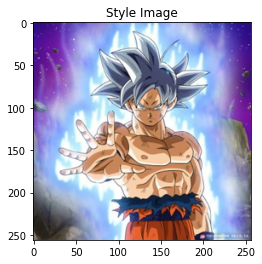

style 1


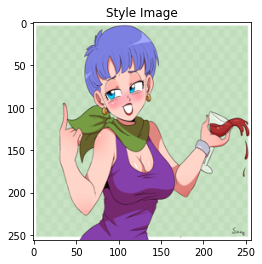

style 2


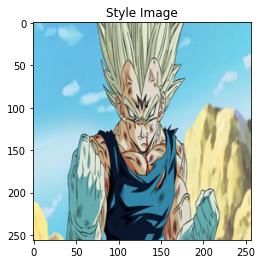

style 3


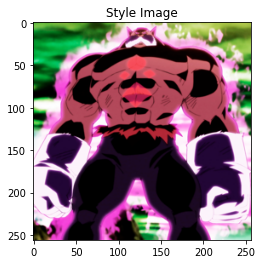

style 4


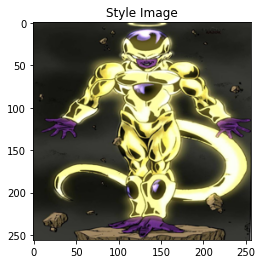

style 5


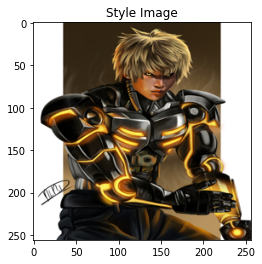

style 6


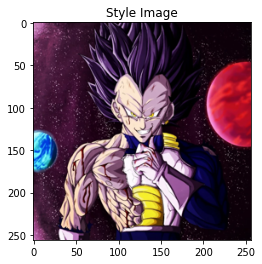

style 7


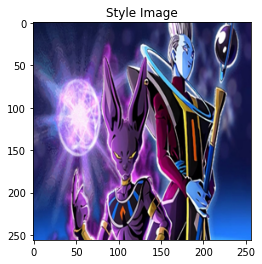

style 8


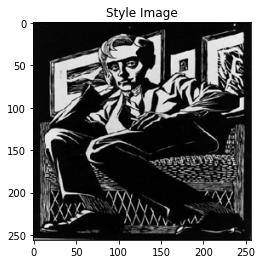

style 9


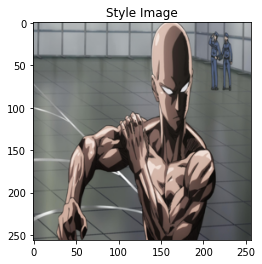

style 10


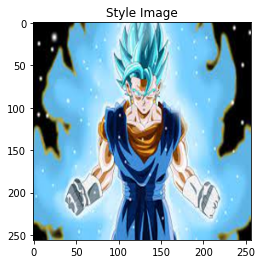

style 11


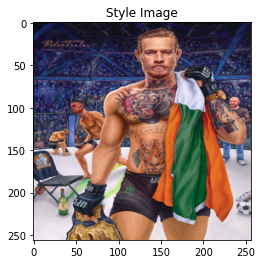

style 12


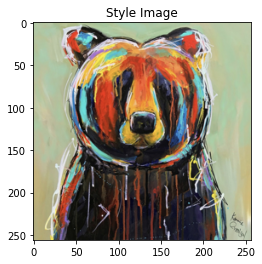

style 13


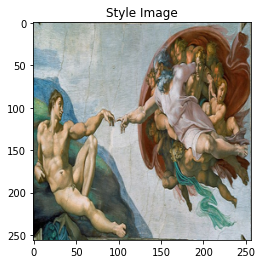

In [1]:
#needed after restructuring of directory
import os
os.chdir('/Users/alexchandler/UFC_Prediction_2022')
os.getcwd()

#this is all copied from https://pytorch.org/tutorials/advanced/neural_style_tutorial.html
from __future__ import print_function

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import pandas as pd

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
import torchvision.models as models

import copy

from torchvision.utils import save_image
import torch
import torchvision

import random

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

cnn = models.vgg19(pretrained=True).features.to(device).eval()


# desired size of the output image
imsize = 512 if torch.cuda.is_available() else 256  # use small size if no gpu

loader = transforms.Compose([
    transforms.Resize(imsize),  # scale imported image
    transforms.ToTensor()])  # transform it into a torch tensor


def image_loader(image):
    # fake batch dimension required to fit network's input dimensions
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)

styleimage0=Image.open("src/models/buildingMLModel/images/escher1.jpeg") 

styleimage1=Image.open("src/models/buildingMLModel/images/onepunch.jpg")

styleimage2=Image.open("src/models/buildingMLModel/images/pixelart.jpeg")
styleimage3=Image.open("src/models/buildingMLModel/images/vegito.jpeg") 
styleimage4=Image.open("src/models/buildingMLModel/images/conorpainting.jpeg")  
styleimage5=Image.open("src/models/buildingMLModel/images/picasso.jpeg")  
styleimage6=Image.open("src/models/buildingMLModel/images/paintedoblivion.webp")
styleimage7=Image.open("src/models/buildingMLModel/images/starrynight.jpeg")
styleimage8=Image.open("src/models/buildingMLModel/images/bear.jpeg")
styleimage9=Image.open("src/models/buildingMLModel/images/god.jpeg")
styleimage10=Image.open("src/models/buildingMLModel/images/vangogh.jpeg")  

thresh={0:950,
       1: 250,
        2:1200,
        3: 800,
        4:250,
        5: 40,
        6: 60, 
        7: 100,
        8: 200,
        9: 150,
        10: 160,
       }


styleimage0=styleimage0.resize((256,256))
styleimage1=styleimage1.resize((256,256))
styleimage2=styleimage2.resize((256,256))
styleimage3=styleimage3.resize((256,256))
styleimage4=styleimage4.resize((256,256))
styleimage5=styleimage5.resize((256,256))
styleimage6=styleimage6.resize((256,256))
styleimage7=styleimage7.resize((256,256))
styleimage8=styleimage8.resize((256,256))
styleimage9=styleimage9.resize((256,256))
styleimage10=styleimage10.resize((256,256))



fighterimage=Image.open("src/models/buildingMLModel/images/2KhamzatChimaev.jpg")
fighterimage=fighterimage.resize((256,256))

style = [image_loader(styleimage0),image_loader(styleimage1),image_loader(styleimage2),
         image_loader(styleimage3), image_loader(styleimage4), image_loader(styleimage5), 
         image_loader(styleimage6), image_loader(styleimage7), image_loader(styleimage8),
        image_loader(styleimage9), image_loader(styleimage10)]

#defining an alternate line of styles
styleimage0alt=Image.open("src/models/buildingMLModel/images/uigoku.jpeg")  
styleimage1alt=Image.open("src/models/buildingMLModel/images/bulma.jpeg")
styleimage2alt=Image.open("src/models/buildingMLModel/images/vegeta.webp")
styleimage3alt=Image.open("src/models/buildingMLModel/images/top.webp")  
styleimage4alt=Image.open("src/models/buildingMLModel/images/frieza.jpeg")
styleimage5alt=Image.open("src/models/buildingMLModel/images/genos.jpeg")  
styleimage6alt=Image.open("src/models/buildingMLModel/images/uevegeta.webp")
styleimage7alt=Image.open("src/models/buildingMLModel/images/whis.jpg")
styleimage8alt=Image.open("src/models/buildingMLModel/images/escher1.jpeg") 
styleimage9alt=Image.open("src/models/buildingMLModel/images/onepunch.jpg")
styleimage10alt=Image.open("src/models/buildingMLModel/images/vegito.jpeg") 
styleimage11alt=Image.open("src/models/buildingMLModel/images/conorpainting.jpeg")  
styleimage12alt=Image.open("src/models/buildingMLModel/images/bear.jpeg")
styleimage13alt=Image.open("src/models/buildingMLModel/images/god.jpeg")

style_alt_list=[styleimage0alt,styleimage1alt,styleimage2alt,styleimage3alt,styleimage4alt,
               styleimage5alt, styleimage6alt, styleimage7alt, styleimage8alt, styleimage9alt,
               styleimage10alt, styleimage11alt, styleimage12alt, styleimage13alt]

threshalt={0: 600,
           1: 500, #skip?
           2: 1250,
           3: 1250,
           4:500,
           5:600,
           6:400,
           7: 1250,
           8:950,
           9: 500,
            10: 800,
            11:300,
            12: 300,
            13: 250,
       }

styleimage0alt=styleimage0alt.resize((256,256))
styleimage1alt=styleimage1alt.resize((256,256))
styleimage2alt=styleimage2alt.resize((256,256))
styleimage3alt=styleimage3alt.resize((256,256))
styleimage4alt=styleimage4alt.resize((256,256))
styleimage5alt=styleimage5alt.resize((256,256))
styleimage6alt=styleimage6alt.resize((256,256))
styleimage7alt=styleimage7alt.resize((256,256))

styleimage8alt=styleimage8alt.resize((256,256))
styleimage9alt=styleimage9alt.resize((256,256))
styleimage10alt=styleimage10alt.resize((256,256))
styleimage11alt=styleimage11alt.resize((256,256))
styleimage12alt=styleimage12alt.resize((256,256))
styleimage13alt=styleimage13alt.resize((256,256))

stylealt = [image_loader(styleimage0alt),image_loader(styleimage1alt),image_loader(styleimage2alt),
           image_loader(styleimage3alt), 
         image_loader(styleimage4alt), 
           image_loader(styleimage5alt),image_loader(styleimage6alt),image_loader(styleimage7alt),
           image_loader(styleimage8alt),image_loader(styleimage9alt),
         image_loader(styleimage10alt), image_loader(styleimage11alt), 
          image_loader(styleimage12alt),
        image_loader(styleimage13alt)]

content_img = image_loader(fighterimage)
assert all(style[i].size() == content_img.size() for i in range(len(style))), \
    "we need to import style and content images of the same size"

unloader = transforms.ToPILImage()  # reconvert into PIL image

plt.ion()

def imshow(tensor, title=None):
    image = tensor.cpu().clone()  # we clone the tensor to not do changes on it
    image = image.squeeze(0)      # remove the fake batch dimension
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001) # pause a bit so that plots are updated
    
class ContentLoss(nn.Module):

    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        # we 'detach' the target content from the tree used
        # to dynamically compute the gradient: this is a stated value,
        # not a variable. Otherwise the forward method of the criterion
        # will throw an error.
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input
    
def gram_matrix(input):
    a, b, c, d = input.size()  # a=batch size(=1)
    # b=number of feature maps
    # (c,d)=dimensions of a f. map (N=c*d)

    features = input.view(a * b, c * d)  # resise F_XL into \hat F_XL

    G = torch.mm(features, features.t())  # compute the gram product

    # we 'normalize' the values of the gram matrix
    # by dividing by the number of element in each feature maps.
    return G.div(a * b * c * d)

class StyleLoss(nn.Module):

    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input
    
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

# create a module to normalize input image so we can easily put it in a
# nn.Sequential
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        # .view the mean and std to make them [C x 1 x 1] so that they can
        # directly work with image Tensor of shape [B x C x H x W].
        # B is batch size. C is number of channels. H is height and W is width.
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        # normalize img
        return (img - self.mean) / self.std
    
# desired depth layers to compute style/content losses :
content_layers_default = ['conv_4']
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, content_img,
                               content_layers=content_layers_default,
                               style_layers=style_layers_default):
    # normalization module
    normalization = Normalization(normalization_mean, normalization_std).to(device)

    # just in order to have an iterable access to or list of content/syle
    # losses
    content_losses = []
    style_losses = []

    # assuming that cnn is a nn.Sequential, so we make a new nn.Sequential
    # to put in modules that are supposed to be activated sequentially
    model = nn.Sequential(normalization)

    i = 0  # increment every time we see a conv
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            # The in-place version doesn't play very nicely with the ContentLoss
            # and StyleLoss we insert below. So we replace with out-of-place
            # ones here.
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            # add content loss:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            # add style loss:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    # now we trim off the layers after the last content and style losses
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses

input_img = content_img.clone()
# if you want to use white noise instead uncomment the below line:
# input_img = torch.randn(content_img.data.size(), device=device)

# add the original input image to the figure:
plt.figure()

for i in range(len(stylealt)):
    print('style '+str(i))
    imshow(stylealt[i], title='Style Image')

def get_input_optimizer(input_img):
    # this line to show that input is a parameter that requires a gradient
    optimizer = optim.LBFGS([input_img])
    return optimizer

def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=300,
                       style_weight=1000000, content_weight=1):
    """Run the style transfer."""
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_img, content_img)
    # We want to optimize the input and not the model parameters so we
    # update all the requires_grad fields accordingly
    input_img.requires_grad_(True)
    model.requires_grad_(False)
    optimizer = get_input_optimizer(input_img)
    run = [0]
    while run[0] <= num_steps:
        def closure():
            # correct the values of updated input image
            with torch.no_grad():
                input_img.clamp_(0, 1)
            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0
            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss
            style_score *= style_weight
            content_score *= content_weight
            loss = style_score + content_score
            loss.backward()
            run[0] += 1
            if run[0] ==50:
                print('Style Loss : {:4f}'.format(style_score.item()))
            return style_score + content_score
        optimizer.step(closure)
    # a last correction...
    with torch.no_grad():
        input_img.clamp_(0, 1)
    return input_img

    
alt=False
def run_style_transfer_adaptive(cnn, normalization_mean, normalization_std,
                       content_img, styleindex, input_img, num_steps=300,
                       style_weight=1000000, content_weight=1):
    style_img=style[styleindex]
    if alt==True:
        style_img=stylealt[styleindex]
    firstLoss={0:0}
    """Run the style transfer."""
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_img, content_img)
    # We want to optimize the input and not the model parameters so we
    # update all the requires_grad fields accordingly
    input_img.requires_grad_(True)
    model.requires_grad_(False)
    optimizer = get_input_optimizer(input_img)
    run = [0]
    while run[0] <= num_steps and firstLoss[0]==0:
        def closure():
            # correct the values of updated input image
            with torch.no_grad():
                input_img.clamp_(0, 1)
            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0
            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss
            style_score *= style_weight
            content_score *= content_weight
            loss = style_score + content_score
            loss.backward()
            run[0] += 1
            if run[0] % 50 == 0:
                if (style_score.item()>thresh[styleindex] and alt==False) or (style_score.item()>threshalt[styleindex] and alt==True):
                    firstLoss[0]=style_score.item()
            return style_score + content_score
        optimizer.step(closure)
    # a last correction...
    with torch.no_grad():
        input_img.clamp_(0, 1)
    if firstLoss[0]==0:
        return input_img
    else:
        return 'empty'
    
    
ufcfighterscrap =pd.read_csv('src/models/buildingMLModel/data/processed/fighter_stats.csv',sep=',',low_memory=False)
names = list(ufcfighterscrap['name'])

#to test the most recently added style image
def apply_style(image, styleindex):
    fighterimage=Image.open(image);fighterimage
    fighterimage=fighterimage.resize((256,256))
    content_img = image_loader(fighterimage)
    input_img = content_img.clone()
    if alt==True:
        output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                                content_img, stylealt[styleindex], input_img)
    else:
        output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                                content_img, style[styleindex], input_img)

    plt.figure()
    imshow(output, title='Output Image')
    # sphinx_gallery_thumbnail_number = 4
    plt.ioff()
    plt.show()
    
# ARGS: e.g. name='VicenteLuque', styleimg=styleimage9alt
def stylize_gif(name,styleimg=styleimage9alt):
    # stylize gif (not working because they are gif files instead of jpegs)
    gif_images = {}
    styleimg=styleimg.resize((350,350))
    styleimg=styleimg.convert('RGB') #needed else the alpha layer messes up stylization
    style=image_loader(styleimg)
    directory='src/models/buildingMLModel/gifs/'+name
    allfiles=os.listdir(directory)
    allfiles.sort()
    for filename in allfiles:
        print(filename[6:9])
        image = os.path.join(directory, filename)
        # checking if it is a file
        if os.path.isfile(image):
            fighterimage=Image.open(image)
            fighterimage=fighterimage.resize((350,350))
            fighterimage=fighterimage.convert('RGB') #needed else the alpha layer messes up stylization
            content_img = image_loader(fighterimage)
            input_img = content_img.clone()
            output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                                            content_img, style, input_img)
            gif_images[filename[6:9]]=output
            plt.figure()
            imshow(input_img)
            plt.ioff()
            plt.show()
    #saves all stylized images in a folder ready to make gif
    for key in gif_images.keys():
        save_image(gif_images[key], 'src/models/buildingMLModel/gifs/'+name+'2/'+str(key)+'.jpg')
    images = []
    directory='src/models/buildingMLModel/gifs/'+name+'2/'
    allfiles=os.listdir(directory)
    allfiles.sort()
    for filename in allfiles:
        images.append(imageio.imread(directory+filename))
    imageio.mimsave('src/models/buildingMLModel/gifs/postCNNGIFs/'+name+'.gif', images)
    print('saved to '+'src/models/buildingMLModel/gifs/postCNNGIFs/'+name+'.gif')
    
name='BelalMuhammad'
def test_gif_style(name):
    for j in range(len(stylealt)):
        print('style'+str(j))
        # stylize gif (not working because they are gif files instead of jpegs)
        gif_images = {}
        styleimg=style_alt_list[j]
        styleimg=styleimg.resize((350,350))
        styleimg=styleimg.convert('RGB') #needed else the alpha layer messes up stylization
        style=image_loader(styleimg)
        directory='src/models/buildingMLModel/gifs/'+name
        allfiles=os.listdir(directory)
        allfiles.sort()
        for filename in allfiles:
            image = os.path.join(directory, filename)
            # checking if it is a file
            if os.path.isfile(image):
                fighterimage=Image.open(image)
                fighterimage=fighterimage.resize((350,350))
                fighterimage=fighterimage.convert('RGB') #needed else the alpha layer messes up stylization
                content_img = image_loader(fighterimage)
                input_img = content_img.clone()
                output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                                                content_img, style, input_img)
                gif_images[filename[6:9]]=output
                plt.figure()
                imshow(input_img)
                plt.ioff()
                plt.show()
            break
            
#sometimes the stylizations went poorly for some images and you have to delete a subset and rebuild the gif
#ARG: enter FirstnameLastname e.g. BelalMuhammad
def rebuild_gif(name):
    images = []
    directory='src/models/buildingMLModel/gifs/'+name+'2/'
    allfiles=os.listdir(directory)
    allfiles.sort()
    for filename in allfiles:
        if filename[0]!='.':
            images.append(imageio.imread(directory+filename))
    imageio.mimsave('src/models/buildingMLModel/gifs/postCNNGIFs/'+name+'.gif', images)
    print('saved to '+'src/models/buildingMLModel/gifs/postCNNGIFs/'+name+'.gif')


In [ ]:
# stylize gif (not working because they are gif files instead of jpegs)
gif_images = {}
styleimg=styleimage9alt
styleimg=styleimg.resize((350,350))
styleimg=styleimg.convert('RGB') #needed else the alpha layer messes up stylization
style=image_loader(styleimg)
name='VicenteLuque'
directory='src/models/buildingMLModel/gifs/'+name
allfiles=os.listdir(directory)
allfiles.sort()
for filename in allfiles:
    print(filename[6:9])
    image = os.path.join(directory, filename)
    # checking if it is a file
    if os.path.isfile(image):
        fighterimage=Image.open(image)
        fighterimage=fighterimage.resize((350,350))
        fighterimage=fighterimage.convert('RGB') #needed else the alpha layer messes up stylization
        content_img = image_loader(fighterimage)
        input_img = content_img.clone()
        output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                                        content_img, style, input_img)
        gif_images[filename[6:9]]=output
        plt.figure()
        imshow(input_img)
        plt.ioff()
        plt.show()
        

In [ ]:
#saves all stylized images in a folder ready to make gif
for key in gif_images.keys():
    save_image(gif_images[key], 'src/models/buildingMLModel/gifs/VicenteLuque2/'+str(key)+'.jpg')

In [ ]:
#needed to sort correctly (only works if there are less than 100 frames)

#saves the gif
import imageio
images = []
directory='src/models/buildingMLModel/gifs/VicenteLuque2/'
allfiles=os.listdir(directory)
allfiles.sort()
for filename in allfiles:
    images.append(imageio.imread(directory+filename))
imageio.mimsave('src/models/buildingMLModel/gifs/VicenteLuque.gif', images)
print('saved to '+'src/models/buildingMLModel/gifs/VicenteLuque.gif')

In [ ]:
#this will test which style is most fitting
test_gif_style(name)

In [ ]:
#before you run this, you must populate a folder  in src/models/buildingMLModel/gifs/ (use https://ezgif.com/split)
#named 'FirstnameLastname' (no spaces) with frames of a gif
#this function will populate the folder name2 where name is the reduced name of the fighter
stylize_gif('BelalMuhammad',styleimage12alt)

In [ ]:
#sometimes the stylizations went poorly for some images and you have to delete a subset and rebuild the gif
#ARG: enter FirstnameLastname e.g. BelalMuhammad
rebuild_gif('BelalMuhammad')

In [ ]:
test_gif_style('AmandaLemos')

In [ ]:
test_gif_style('JessicaAndrade')

In [ ]:
stylize_gif('AmandaLemos',styleimage4alt)

In [ ]:
stylize_gif('JessicaAndrade',styleimage3alt)

In [ ]:
rebuild_gif('JessicaAndrade')

In [ ]:
rebuild_gif('AmandaLemos')

In [ ]:
test_gif_style('RobFont')

In [ ]:
test_gif_style('MarlonVera')

In [ ]:
stylize_gif('RobFont',styleimage0alt)

In [ ]:
stylize_gif('MarlonVera',styleimage7alt)

In [ ]:
rebuild_gif('MarlonVera')


style0


/var/folders/zr/jttn57m976g1m1_y2p2t8zwm0000gn/T/ipykernel_6357/396025741.py:225: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1)
/var/folders/zr/jttn57m976g1m1_y2p2t8zwm0000gn/T/ipykernel_6357/396025741.py:226: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1)


Style Loss : 372.491180


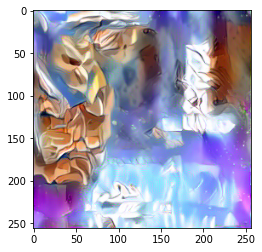

style1
Style Loss : 632.904602


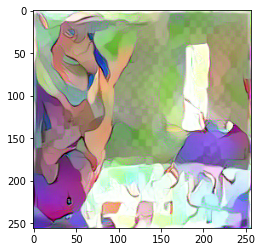

style2
Style Loss : 659.679138


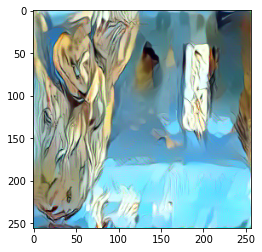

style3
Style Loss : 1020.209656


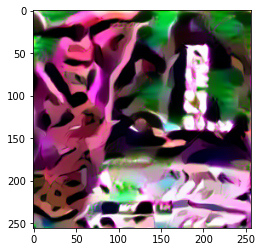

style4
Style Loss : 251.694000


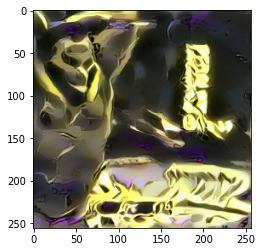

style5
Style Loss : 221.961029


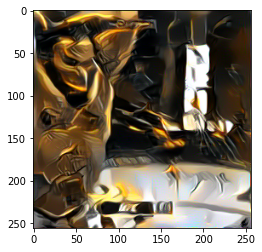

style6
Style Loss : 143.580139


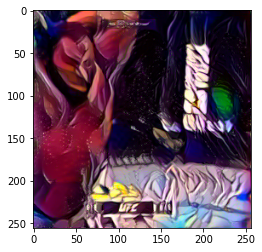

style7
Style Loss : 486.780823


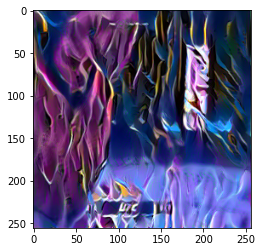

style8
Style Loss : 533.882202


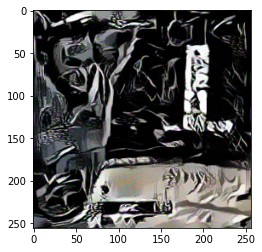

style9
Style Loss : 117.823540


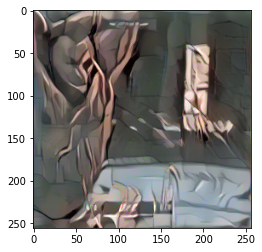

style10
Style Loss : 527.292114


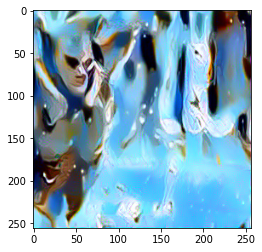

style11
Style Loss : 123.567184


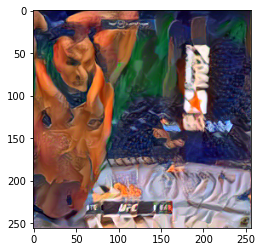

style12
Style Loss : 161.254547


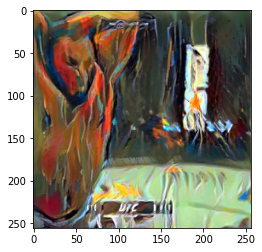

style13
Style Loss : 87.749016


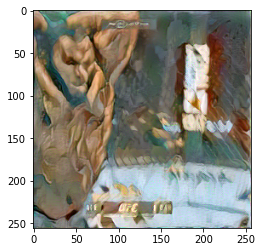

In [3]:
test_gif_style('ChrisBarnett')

00_


/var/folders/zr/jttn57m976g1m1_y2p2t8zwm0000gn/T/ipykernel_6357/396025741.py:225: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1)
/var/folders/zr/jttn57m976g1m1_y2p2t8zwm0000gn/T/ipykernel_6357/396025741.py:226: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1)


Style Loss : 125.373337


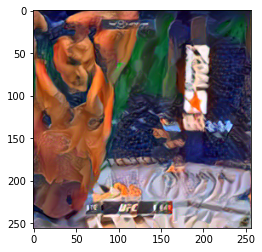

01_
Style Loss : 123.607635


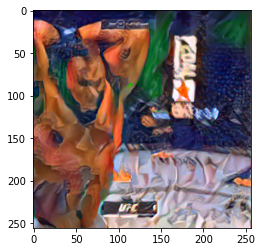

02_
Style Loss : 115.721786


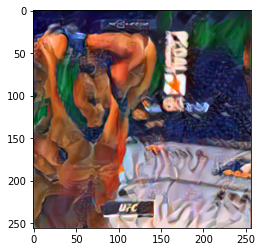

03_
Style Loss : 124.771149


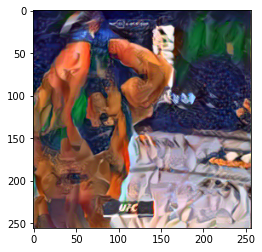

04_
Style Loss : 139.069687


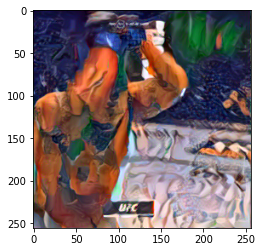

05_
Style Loss : 133.738449


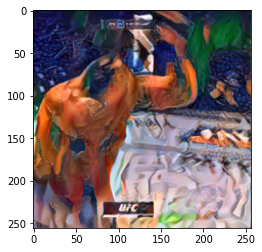

06_
Style Loss : 106.470337


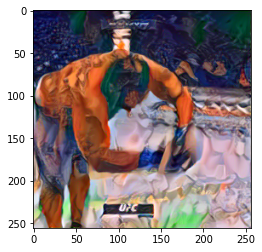

07_
Style Loss : 109.355118


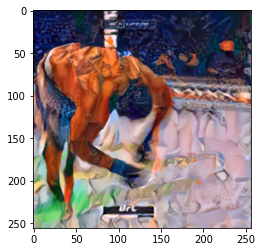

08_
Style Loss : 127.365723


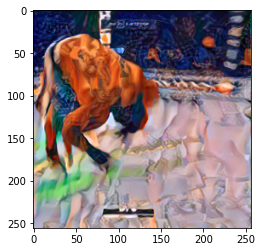

09_
Style Loss : 150.348145


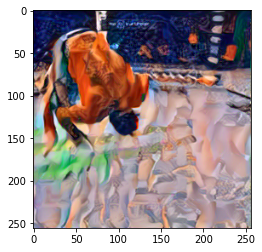

10_
Style Loss : 151.814255


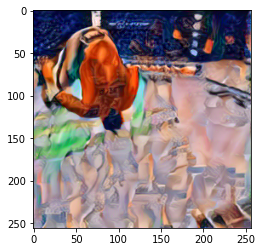

11_
Style Loss : 153.159500


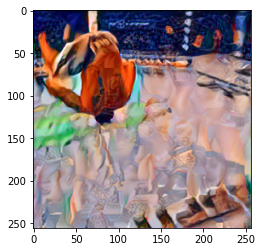

12_
Style Loss : 156.526489


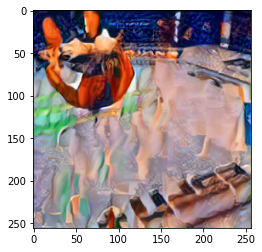

13_
Style Loss : 148.266876


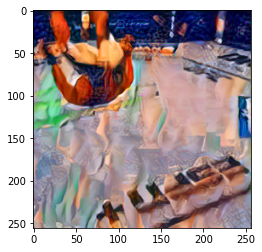

14_
Style Loss : 156.864273


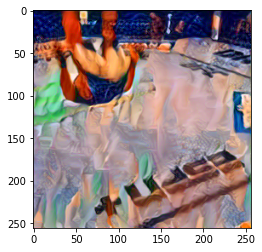

15_
Style Loss : 155.799164


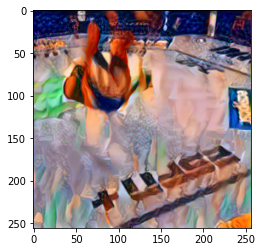

16_
Style Loss : 142.367645


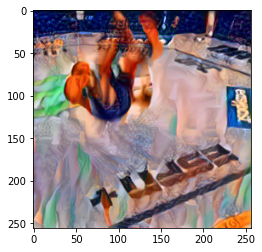

17_
Style Loss : 146.848434


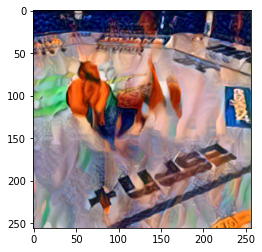

18_
Style Loss : 152.783585


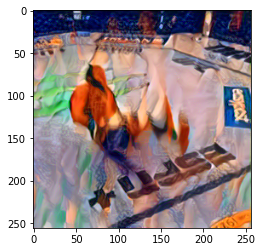

19_
Style Loss : 131.783020


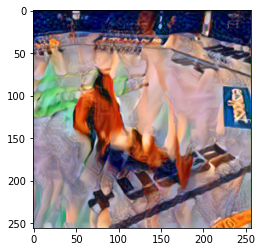

20_
Style Loss : 135.780807


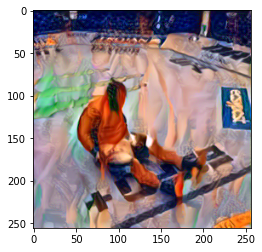

21_
Style Loss : 135.982590


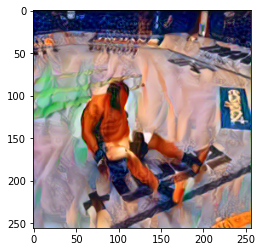

22_
Style Loss : 131.132904


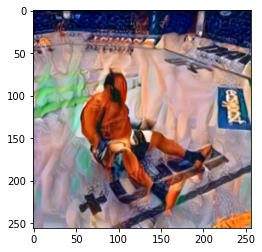

23_
Style Loss : 135.358185


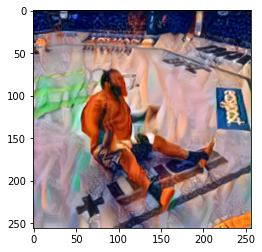

24_
Style Loss : 116.710419


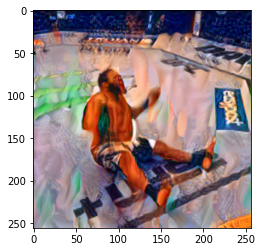

25_
Style Loss : 124.480690


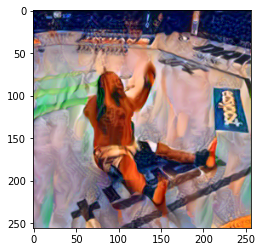

26_
Style Loss : 121.219086


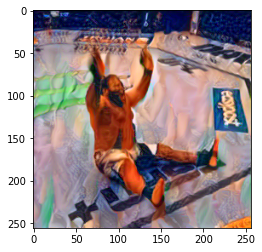

27_
Style Loss : 118.800049


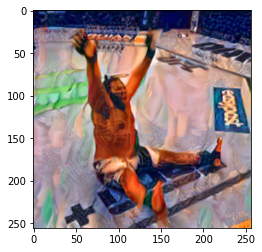

28_
Style Loss : 194.626389


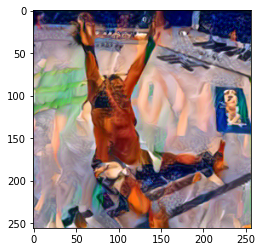

29_
Style Loss : 114.645706


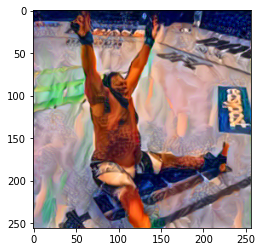

30_
Style Loss : 121.923286


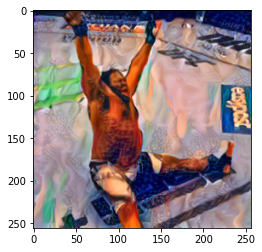

31_
Style Loss : 123.917183


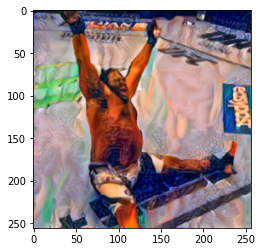

32_
Style Loss : 140.155823


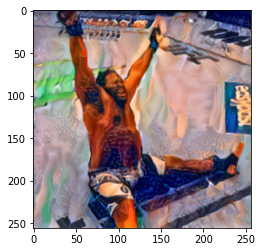

33_
Style Loss : 138.067139


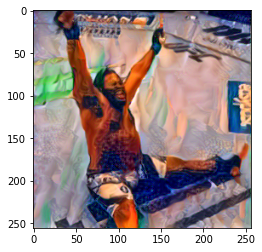

34_
Style Loss : 130.660141


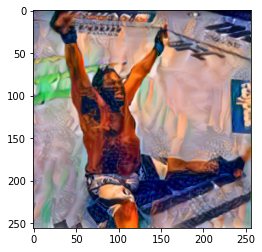

35_
Style Loss : 135.711823


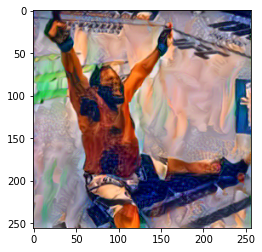

36_
Style Loss : 124.537209


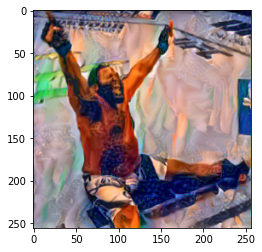

37_
Style Loss : 139.814270


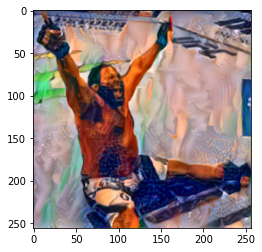

38_
Style Loss : 125.571693


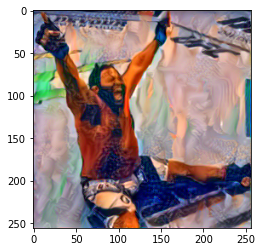

39_
Style Loss : 129.534302


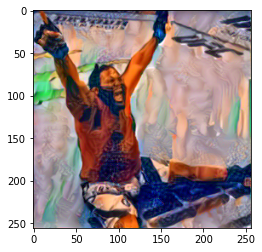

40_
Style Loss : 134.849442


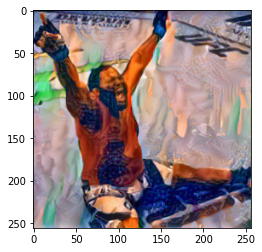

41_
Style Loss : 140.420593


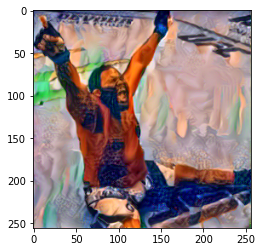

42_
Style Loss : 134.619324


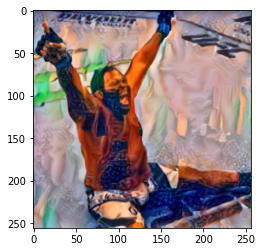

43_
Style Loss : 132.984512


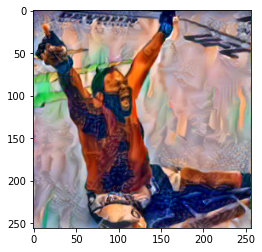

44_
Style Loss : 138.719116


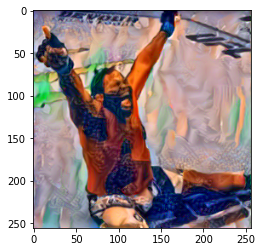

45_
Style Loss : 132.178604


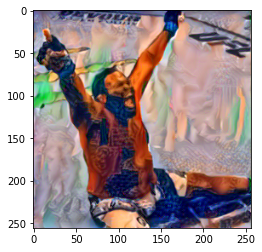

46_
Style Loss : 137.734787


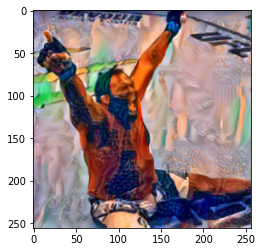

47_
Style Loss : 135.442215


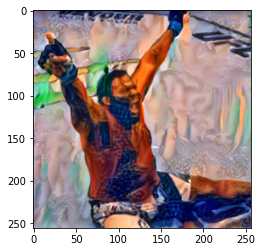

48_
Style Loss : 161.879120


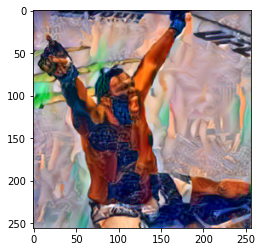

49_
Style Loss : 137.191528


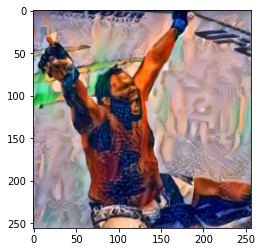

50_
Style Loss : 129.560501


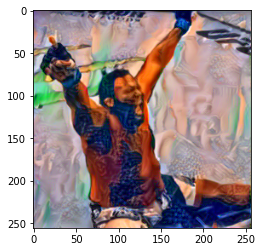

51_
Style Loss : 131.361099


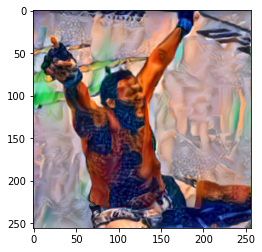

52_
Style Loss : 141.493027


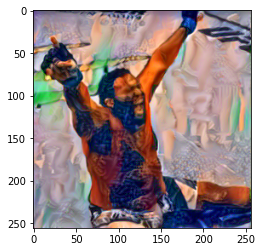

53_
Style Loss : 133.747589


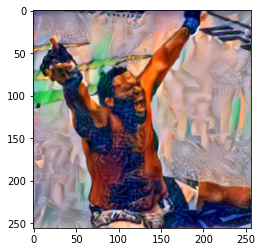

54_
Style Loss : 145.332214


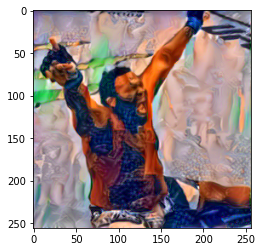

55_
Style Loss : 151.672485


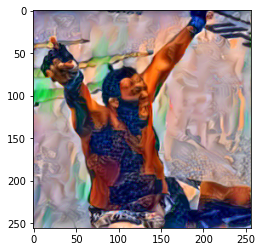

56_
Style Loss : 130.090546


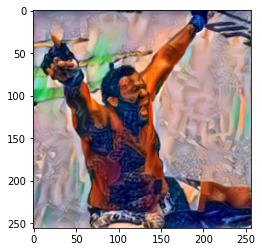

57_
Style Loss : 128.756699


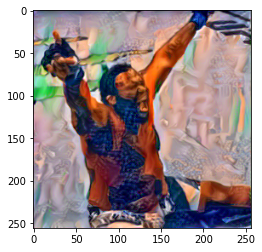

58_
Style Loss : 146.150436


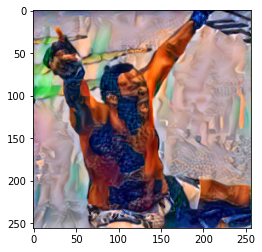

59_
Style Loss : 135.272812


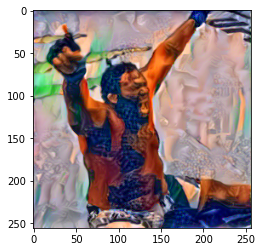

60_
Style Loss : 132.174255


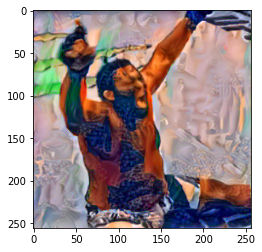

61_
Style Loss : 131.554550


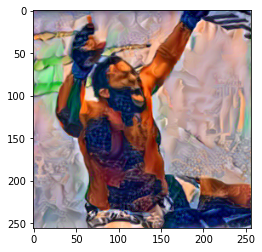

62_
Style Loss : 125.509117


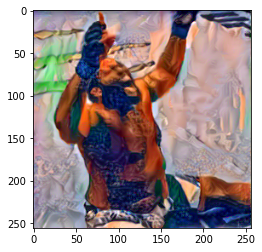

63_
Style Loss : 344.456757


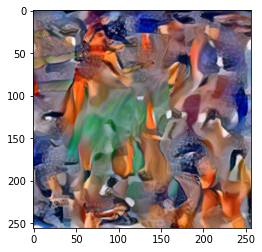

64_
Style Loss : 119.407715


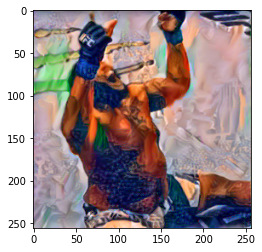

65_
Style Loss : 122.897995


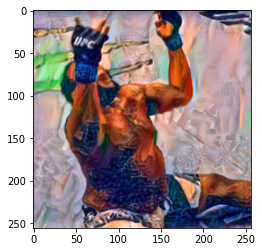

66_
Style Loss : 130.226593


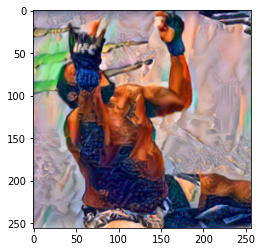

67_
Style Loss : 125.845428


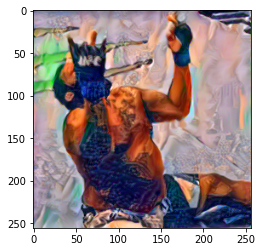

68_
Style Loss : 126.371567


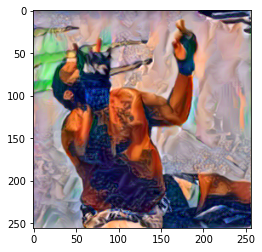

69_
Style Loss : 132.069778


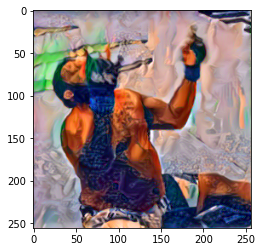

70_
Style Loss : 130.078293


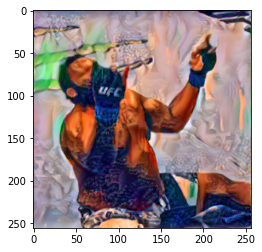

71_
Style Loss : 130.052567


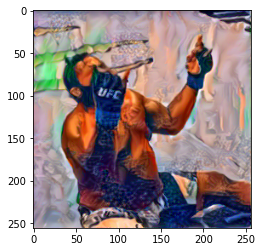

72_
Style Loss : 124.566841


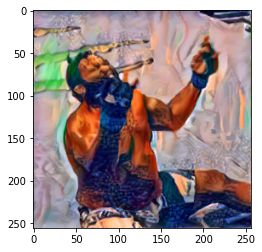

73_
Style Loss : 132.563583


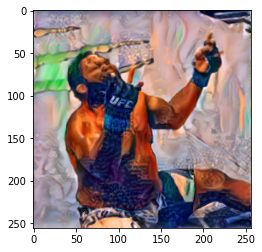

74_
Style Loss : 131.369019


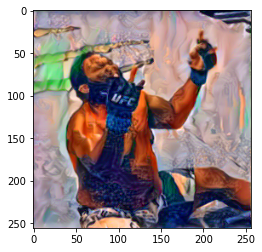

75_
Style Loss : 122.599754


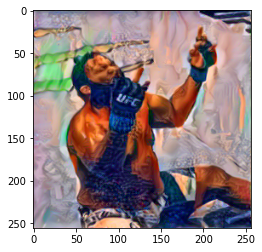

76_
Style Loss : 132.138397


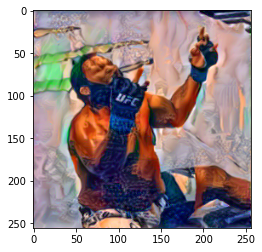

77_
Style Loss : 128.107437


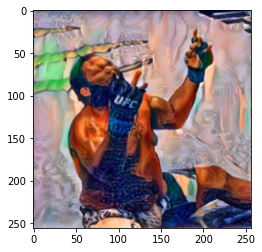

78_
Style Loss : 130.155090


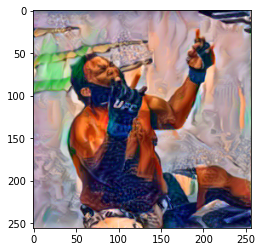

79_
Style Loss : 141.706955


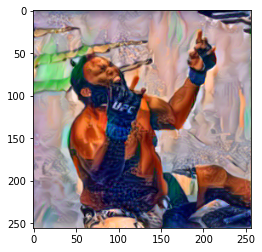

80_
Style Loss : 124.930214


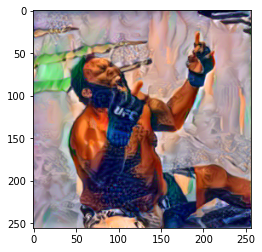

81_
Style Loss : 128.895111


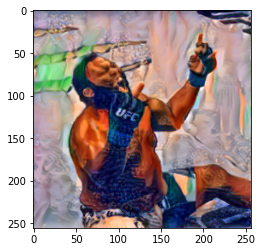

82_
Style Loss : 127.230957


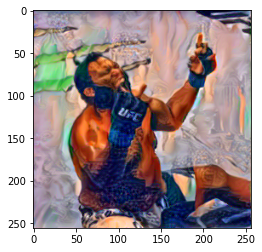

83_
Style Loss : 120.850616


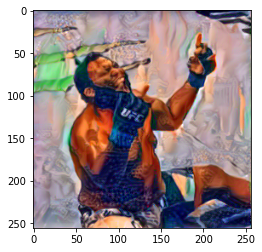

84_
Style Loss : 128.719879


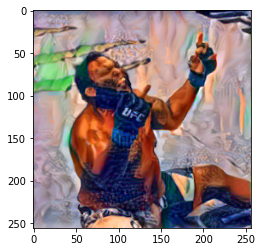

85_
Style Loss : 124.100014


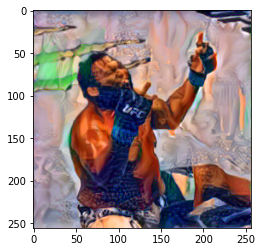

86_
Style Loss : 127.654366


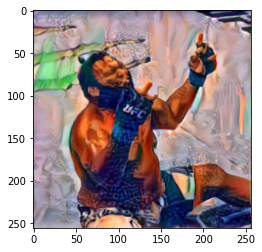

87_
Style Loss : 124.643234


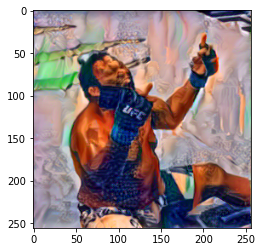

88_
Style Loss : 128.184555


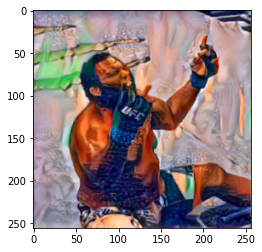

89_
Style Loss : 125.026764


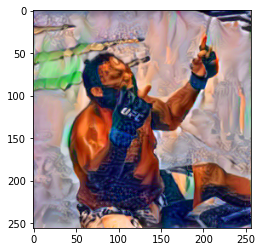

90_
Style Loss : 129.913818


In [ ]:
stylize_gif('ChrisBarnett',styleimage11alt)